# Text Mining and Search Project

Matteo Cesaro - 867350 - m.cesaro1@campus.unimib.it<br/>
Francesco Martinelli - 873685 - f.martinelli21@campus.unimib.it<br/>
Cristiano Ruttico - 809360 - c.ruttico@campus.unimib.it<br/>


## Clustering

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount = True)

Mounted at /content/gdrive


### Libraries and dataset importation

The libraries are imported.

In [1]:
# Data Management
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import numpy as np
import pandas as pd

# Vectorizer TfIdf
from sklearn.feature_extraction.text import TfidfVectorizer

# Data Transformation
from sklearn.decomposition import TruncatedSVD
from yellowbrick.cluster import KElbowVisualizer
from sklearn.manifold import TSNE

# Clustering Algorithm
from sklearn.cluster import KMeans, AgglomerativeClustering


# Clustering Evaluation
from sklearn import metrics

The dataset is imported.

In [ ]:
df_tot = pd.read_csv('/content/gdrive/MyDrive/Dataset/df_preproc_nltk', index_col=[0] )

In [ ]:
df_tot.head()

,text,label,tokenized,lemmatized,stemmed
0,mr costner dragged movie far longer necessary ...,1,"['mr', 'costner', 'dragged', 'movie', 'far', '...","['mr', 'costner', 'dragged', 'movie', 'far', '...","['mr', 'costner', 'drag', 'movi', 'far', 'long..."
1,example majority action films same generic bor...,1,"['example', 'majority', 'action', 'films', 'sa...","['example', 'majority', 'action', 'film', 'sam...","['exampl', 'major', 'action', 'film', 'same', ..."
2,first hate moronic rappers could nt act gun pr...,1,"['first', 'hate', 'moronic', 'rappers', 'could...","['first', 'hate', 'moronic', 'rapper', 'could'...","['first', 'hate', 'moron', 'rapper', 'could', ..."
3,even beatles could write songs everyone liked ...,1,"['even', 'beatles', 'could', 'write', 'songs',...","['even', 'beatles', 'could', 'write', 'song', ...","['even', 'beatl', 'could', 'write', 'song', 'e..."
4,brass pictures movies fitting word them really...,1,"['brass', 'pictures', 'movies', 'fitting', 'wo...","['brass', 'picture', 'movie', 'fitting', 'word...","['brass', 'pictur', 'movi', 'fit', 'word', 'th..."


In [ ]:
df_tot["stemmed"] = df_tot["stemmed"].apply(lambda x: x.replace(",", ""))
df_tot["stemmed"] = df_tot["stemmed"].apply(lambda x: x.replace("'", ""))
df_tot["stemmed"] = df_tot["stemmed"].apply(lambda x: x.replace("[", ""))
df_tot["stemmed"] = df_tot["stemmed"].apply(lambda x: x.replace("]", ""))

The dataset is trasformed using tf-idf BoW representation.

In [ ]:
tv = TfidfVectorizer(min_df=0.03, max_df=0.97, use_idf=True)
tv_matrix = tv.fit_transform(df_tot.stemmed[0:50000]) 
tv_matrix = tv_matrix.toarray()

vocab = tv.get_feature_names()
X = pd.DataFrame(np.round(tv_matrix, 2), columns=vocab)
X

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,abl,about,absolut,across,act,action,actor,actress,actual,ad,add,again,age,ago,agre,all,allow,almost,alon,along,alreadi,also,although,alway,amaz,american,and,anim,annoy,anoth,anyon,anyth,anyway,apart,appar,appear,appreci,around,art,as,...,war,wast,watch,way,we,weak,well,went,what,whether,whi,which,white,who,whole,whose,wife,win,wish,with,without,woman,women,wonder,word,work,world,wors,worst,worth,would,write,writer,written,wrong,ye,year,yet,you,young
0,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.14,0.00,0.0,0.0,0.0,0.14,0.0,0.13,0.0,0.0,...,0.00,0.0,0.00,0.10,0.00,0.0,0.09,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.18,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0
1,0.00,0.00,0.0,0.0,0.20,0.19,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.09,0.12,0.00,0.00,0.00,0.00,0.09,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,...,0.00,0.1,0.23,0.00,0.00,0.0,0.06,0.00,0.0,0.0,0.0,0.0,0.0,0.11,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.09,0.00,0.00,0.0,0.0,0.0,0.20,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0
2,0.00,0.13,0.0,0.0,0.20,0.00,0.15,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.12,0.07,0.00,0.00,0.00,0.0,0.00,0.0,0.12,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,...,0.00,0.0,0.06,0.00,0.11,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0
3,0.00,0.00,0.0,0.0,0.12,0.09,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.09,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,...,0.00,0.1,0.11,0.00,0.00,0.0,0.06,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.1,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0
4,0.00,0.00,0.0,0.0,0.00,0.10,0.00,0.13,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.00,0.12,0.00,0.00,0.00,0.10,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.10,0.0,0.0,...,0.12,0.0,0.06,0.00,0.00,0.0,0.07,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.13,0.00,0.0,0.11,0.0,0.00,0.12,0.00,0.0,0.0,0.0,0.11,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,...,0.00,0.0,0.08,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0
49996,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.22,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,...,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.20,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0
49997,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.07,0.0,0.00,0.0,0.06,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.07,0.08,0.0,0.06,0.0,0.00,0.0,0.00,0.07,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,...,0.08,0.0,0.08,0.05,0.00,0.0,0.05,0.08,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.08,0.0,0.00,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.06,0.00,0.00,0.0
49998,0.14,0.00,0.0,0.0,0.00,0.11,0.00,0.00,0.2,0.0,0.0,0.00,0.0,0.15,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.16,0.00,0.11,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,...,0.00,0.0,0.00,0.00,0.00,0.0,0.08,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0

### Data Visualization for Clustering


We implement dimensional (2-dimensional and 3-dimensional) reduction via *TruncatedSVD* which implements spatial transformations via SVM to transform the data and make it viewable; this would qualitatively identify an appropriate number of clusters for the task.

In [ ]:
svd = TruncatedSVD(n_components=2)
data = svd.fit_transform(X) 
scatter_x_tr = data[:, 0]
scatter_y_tr = data[:, 1]

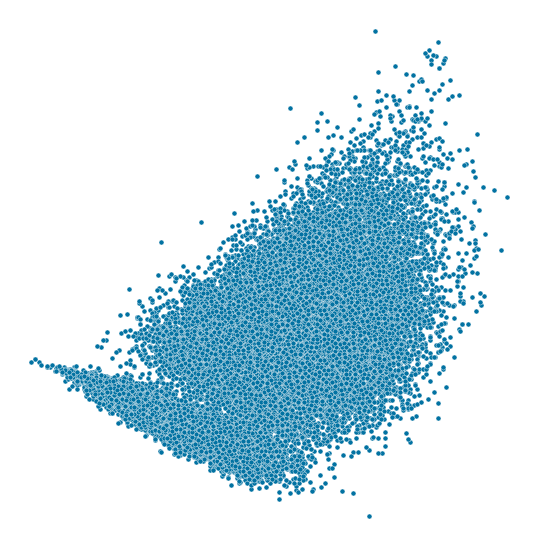

In [ ]:
plt.figure(figsize=(8, 8))
sns.scatterplot(x = scatter_x_tr, y=scatter_y_tr, s=25)
plt.tight_layout()
plt.axis('off')
plt.show()

In [ ]:
# # 3D viz
svd = TruncatedSVD(n_components=3)
data = svd.fit_transform(X) 
scatter_x_3d = data[:, 0]
scatter_y_3d = data[:, 1]
scatter_z_3d = data[:, 2]
px.scatter_3d(x=scatter_x_3d, y=scatter_y_3d, z=scatter_z_3d)

An alternative method of data visualization is offered by T-distributed Stochastic Neighbor Embedding (TSNE) i.e., an algorithm for dimensionality reduction.

In [ ]:
svd = TSNE(n_components=2, init='random', learning_rate='auto')
data = svd.fit_transform(X) 
scatter_x = data[:, 0]
scatter_y = data[:, 1]

# long run ~15m

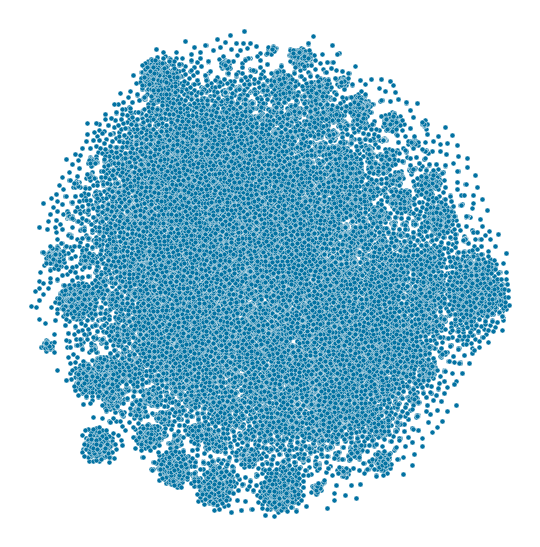

In [ ]:
plt.figure(figsize=(8, 8))
sns.scatterplot(x = scatter_x, y=scatter_y, s=25)
plt.tight_layout()
plt.axis('off')
plt.show()

The graphs show an undefined number of clusters, however a recognizable pattern in the first graph indicates a number of clusters of 2. 

To understand if the number of clustering is adequate has been implemented a grid search that looks for the optimal number of clusters using as benchmark a measure of distance (using the Euclidean distance).

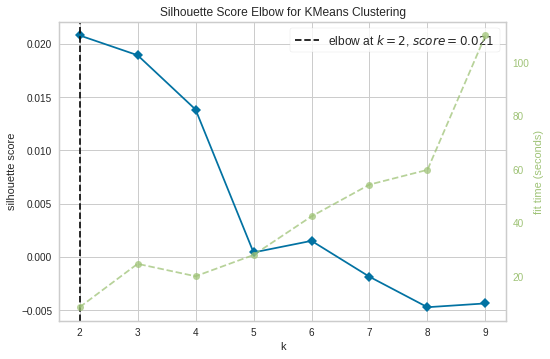

CPU times: user 41min 59s, sys: 1min 29s, total: 43min 29s
Wall time: 24min 32s


In [ ]:
%%time
model = KMeans(random_state=1)
visualizer = KElbowVisualizer(model, k=(2,10), metric='silhouette')

visualizer.fit(X)
visualizer.show()

# long execution >20m

# Result k = 2

With the brute-force method the previous hypothesis has been confirmed. The number of clusters is set as 2.

In [ ]:
n_cl = 2

### K-Means Clustering

The K-Means algorithm was used for clustering. This algorithm is based on iterative centroid adjustment and distance computation. The distance used is the Euclidean distance.

In [ ]:
kmeans = KMeans(n_clusters=n_cl, random_state=1, init="k-means++", max_iter=500)
labels_pred_k = kmeans.fit_predict(X)

In [ ]:
labels_pred_k = abs(labels_pred_k-1)

In [ ]:
labels_pred_k

array([0, 0, 1, ..., 1, 0, 0], dtype=int32)

The result of the clustering is visualized by assigning different colors to the labels.

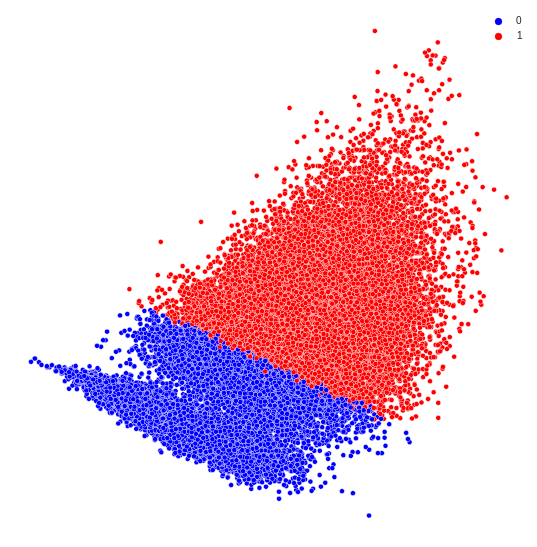

In [ ]:
plt.figure(figsize=(8, 8))
sns.scatterplot(x = scatter_x_tr, y=scatter_y_tr, hue=labels_pred_k, palette=["blue", "red"], s=25)
plt.tight_layout()
plt.axis('off')
plt.show()

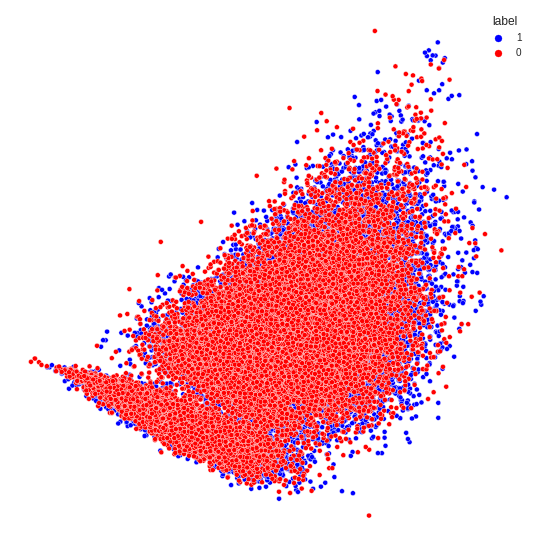

In [ ]:
plt.figure(figsize=(8, 8))
sns.scatterplot(x = scatter_x_tr, y=scatter_y_tr, hue=df_tot.label.astype(str), palette=["blue", "red"], s=25)
plt.tight_layout()
plt.axis('off')
plt.show()

In [ ]:
px.scatter_3d(x=scatter_x_3d, y=scatter_y_3d, z=scatter_z_3d, color=labels_pred_k.astype(str))

In [ ]:
px.scatter_3d(x=scatter_x_3d, y=scatter_y_3d, z=scatter_z_3d, color=df_tot.label.astype(str))

Qualitatively the clustering seems to have obtained bad results, at least considering the orginal labels criterion. The results will be further analyzed later with a quantitative evaluation.

### Agglomerative clustering

It is now implemented a different kind of clustering: the agglomerative clustering. This clustering method is a hierarchical clustering that creates different layers of clusters in a hierarchical way using a bottom up approach.

In [ ]:
aggl = AgglomerativeClustering(n_clusters=n_cl)
labels_pred_agg = aggl.fit_predict(X[7500:42500])

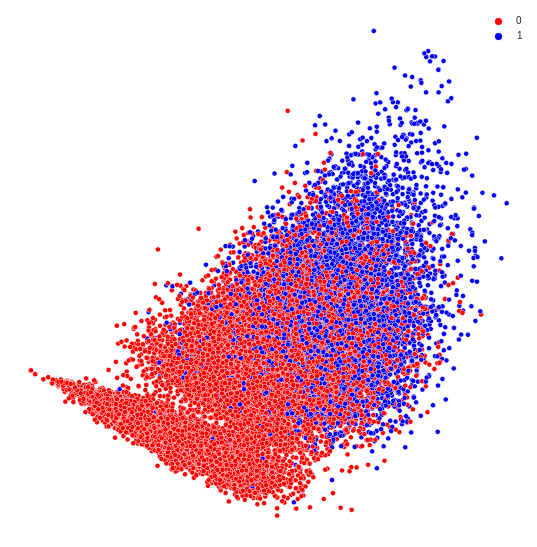

In [ ]:
plt.figure(figsize=(8, 8))
sns.scatterplot(x = scatter_x_tr[7500:42500], y=scatter_y_tr[7500:42500], hue=labels_pred_agg, palette=["red", "blue"], s=25)
plt.tight_layout()
plt.axis('off')
plt.show()

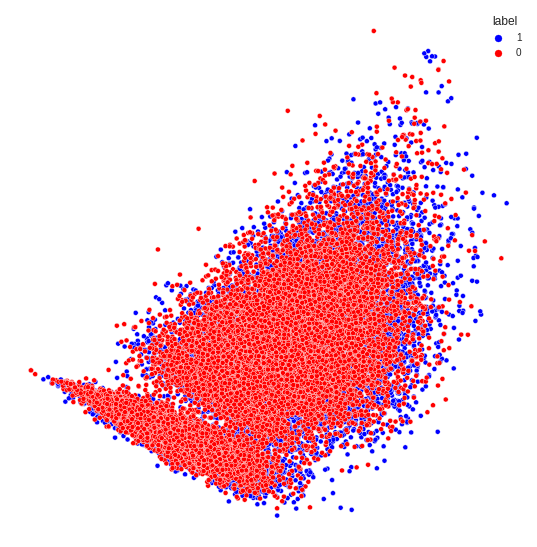

In [ ]:
plt.figure(figsize=(8, 8))
sns.scatterplot(x = scatter_x_tr[7500:42500], y=scatter_y_tr[7500:42500], hue=df_tot.label[7500:42500].astype(str), palette=["blue", "red"], s=25)
plt.tight_layout()
plt.axis('off')
plt.show()

In [ ]:
px.scatter_3d(x=scatter_x_3d[7500:42500], y=scatter_y_3d[7500:42500], z=scatter_z_3d[7500:42500], color=labels_pred_agg.astype(str))

In [ ]:
px.scatter_3d(x=scatter_x_3d[7500:42500], y=scatter_y_3d[7500:42500], z=scatter_z_3d[7500:42500], color=df_tot.label[7500:42500].astype(str))

### Evaluation

The first shown metric shows the evaluation without comparing the clusters to the actual labels. The metric is computed for both the 

In [ ]:
print("K-Means Silhouette Score: ", metrics.silhouette_score(X, labels_pred_k, metric='euclidean'))

K-Means Silhouette Score:  0.020807184072254046


In [ ]:
print("Agglomerative Silhouette Score: ", metrics.silhouette_score(X[7500:42500], labels_pred_agg, metric='euclidean'))

Agglomerative Silhouette Score:  -0.004793699243076361


A function for evaluation is defined. The function syntetizes the main clustering metrics since the true labels are available.

In [ ]:
def score_clustering(true_labels, predicted_labels):
  d = {
      "Adjusted Rand index": metrics.adjusted_rand_score(true_labels, predicted_labels),
      "Adjusted Mutual Info": metrics.adjusted_mutual_info_score(true_labels, predicted_labels),
      "Homogeneity": metrics.homogeneity_score(true_labels, predicted_labels),
      "Completeness": metrics.completeness_score(true_labels, predicted_labels),
      "V measure": metrics.v_measure_score(true_labels, predicted_labels),
      "Fowlkes Mallows": metrics.fowlkes_mallows_score(true_labels, predicted_labels),
      "Accuracy": metrics.accuracy_score(true_labels, predicted_labels)
  }
  for k, v in d.items():
    print(f"{k:21s}: {v}")

In [ ]:
score_clustering(df_tot.label, labels_pred_k)

Adjusted Rand index  : 0.00033990813187275326
Adjusted Mutual Info : 0.00025239060143579024
Homogeneity          : 0.0002648947354968115
Completeness         : 0.0002689864233301291
V measure            : 0.00026692489997896644
Fowlkes Mallows      : 0.5053843415918674
Accuracy             : 0.50948


In [ ]:
score_clustering(df_tot.label[7500:42500], labels_pred_agg)

Adjusted Rand index  : 0.00020464294772734362
Adjusted Mutual Info : 0.0002776467132664164
Homogeneity          : 0.0002576587976116436
Completeness         : 0.00036413713722245324
V measure            : 0.0003017811204169953
Fowlkes Mallows      : 0.5868322870834789
Accuracy             : 0.5074571428571428


### Result Analysis

The result are not satisfing since both the evaluation measures do not offer good values. The reason may be the high density in the data, that makes it hard to find defined and effective clusters, or the still consistent percentage of words without semantic usefullness in the data. One last possibility could be the synonims that are considered as different words while having the same meaning.

We try to analyze the outcome of the process to look for possible shared features within the clusters.

In [ ]:
labels_pred_k[0:9]

array([0, 0, 1, 0, 1, 0, 1, 1, 0], dtype=int32)

In [ ]:
txt1 = df_tot.drop(['label','tokenized','lemmatized', 'stemmed'], axis = 1).head(10)
txt1.reset_index(drop=True, inplace=True)

In [ ]:
txt1

,text
0,mr costner dragged movie far longer necessary ...
1,example majority action films same generic bor...
2,first hate moronic rappers could nt act gun pr...
3,even beatles could write songs everyone liked ...
4,brass pictures movies fitting word them really...
5,funny thing happened watching mosquito one han...
6,german horror film one weirdest seen br br i a...
7,long time fan japanese film expected this can ...
8,tokyo eyes tells year old japanese girl falls ...
9,wealthy horse ranchers buenos aires long stand...


In [ ]:
txt1['text'].apply(lambda x: print(") ",x,"\n"))

)  mr costner dragged movie far longer necessary aside terrific sea rescue sequences care characters us ghosts closet costner s character realized early on forgotten much later time care character really care cocky overconfident ashton kutcher problem comes kid thinks he s better anyone else around shows signs cluttered closet obstacle appears winning costner finally well past half way point stinker costner tells us kutcher s ghosts told kutcher driven best prior inkling foreshadowing magic here could keep turning hour in 

)  example majority action films same generic boring there s really nothing worth watching here complete waste barely tapped talents ice t ice cube who ve proven many times capable acting acting well bother one go see new jack city ricochet watch new york undercover ice t boyz n hood higher learning friday ice cube see real deal ice t s horribly cliched dialogue alone makes film grate teeth i m still wondering heck bill paxton film heck always play exact character a

0    None
1    None
2    None
3    None
4    None
5    None
6    None
7    None
8    None
9    None
Name: text, dtype: object

In [ ]:
labels_pred_k[49990:49999]

array([0, 1, 0, 1, 1, 1, 1, 1, 0], dtype=int32)

In [ ]:
txt2 = df_tot.drop(['label','tokenized','lemmatized', 'stemmed'], axis = 1).tail(10)
txt2.reset_index(drop=True, inplace=True)

In [ ]:
txt2

,text
0,hillarious funny brooks movie ever seen watch ...
1,life stinks parody life death happiness depres...
2,kind film want see glass wine fire on feet up ...
3,read comments film judging average rating see ...
4,life stinks step mel brooks productions stars ...
5,seeing vote average pretty low fact clerk vide...
6,plot wretched unbelievable twists however chem...
7,amazed movie and others average stars lower cr...
8,christmas together actually came time i ve rai...
9,working class romantic drama director martin r...


In [ ]:
txt2['text'].apply(lambda x: print(") ",x,"\n"))

)  hillarious funny brooks movie ever seen watch re watch tape times laugh a cry moments really good funny movie like brooks must short brooks billionare gets streets homeless days order win entire poor district competitor reality bites end warm relations humans hightly recommend 

)  life stinks parody life death happiness depression black white always present lives mel brooks performance brilliant always actors work fine too movie capra flavor that´s good br br there unforgettable gags one brooks tries earn money dancing street people passing ignore him meets funny crazy man believes paul getty start arguing slapping other br br if haven´t seen it don´t know you´ve missed br br this movie tells us old eternal struggle poor rich br br the difference movie reality movie happy ending reality hasn´t br br yes indeed life stinks 

)  kind film want see glass wine fire on feet up require much brain power follow good long day would say unrealistic expecting anything serious bother funny tho

0    None
1    None
2    None
3    None
4    None
5    None
6    None
7    None
8    None
9    None
Name: text, dtype: object

No particular criterion has been identified for the clustering labels.